In [69]:
%matplotlib notebook
from bs4 import BeautifulSoup
import sys
import pandas as pd
import numpy as np
import requests
import re
import urllib
import os
import tempfile
from zipfile import ZipFile
import shutil
from fnmatch import fnmatch
import re
import datetime as dt
import seaborn as sns
import cartopy as ctp
from plotly.offline import init_notebook_mode, plot, iplot
import plotly as py
init_notebook_mode(connected=True) 
import plotly.graph_objs as go 
import warnings            
warnings.filterwarnings("ignore") 
import os
import cartopy.crs as ccrs
from plotly.offline import init_notebook_mode, plot, iplot
import plotly as py
init_notebook_mode(connected=True) 
import plotly.graph_objs
import plotly.express as px

In [30]:
# Configuration
# Répertoire de destination des fichiers de course 
rep_data_course ='data_course'

# Récupération des fichiers Excel avec les classements
Ces Scripts récupèrent les fichiers sur le site du VG pour les stocker localement sur le répertoire indiqué supra.
Il traite les anomalies de malformations des fichiers OpenDocument (zip office Xlsx) et nettoie le Dataframe compilé
Le DF compilé, nettoyé est sauvegardé dans un fichier Pickle
Il est possible de ne pas exécuter ces cellules pour commencer le projet à partir du <a href='#cell_pickle'>Chargement du fichier Pickle </a>

In [31]:
#Chatgement des fichiers de classement dans un répertoire 
url = 'https://www.vendeeglobe.org/fr/classement'
urld_root = 'https://www.vendeeglobe.org/download-race-data/vendeeglobe_'


#Script pour enlever l'attribut xxid qui fait planter l'engine de openpyxl de pandas
def change_in_zip(file_name, name_filter, change):
    tempdir = tempfile.mkdtemp()
    try:
        tempname = os.path.join(tempdir, 'new.zip')
        with ZipFile(file_name, 'r') as r, ZipFile(tempname, 'w') as w:
            for item in r.infolist():
                data = r.read(item.filename)          
                data = change(data)
                w.writestr(item, data)
        shutil.move(tempname, file_name)
    finally:
        shutil.rmtree(tempdir)


def get_soup_from_url(url):
    res = requests.get(url)
    soup = BeautifulSoup(res.content, 'html.parser')
    return soup


def valeurs_correctes(value):
    return value and re.compile("[0-9]{8}_[0-9]{6}").search(value)

soup= get_soup_from_url(url)
liste_classement = soup.find('select', {'class': "form__input m--select onsubmit-rank"})
liste_classement = liste_classement.find_all( value = valeurs_correctes)

#suppression des doublons
u= {v.attrs['value']:v for v in liste_classement}
url_to_download= [[urld_root + v.attrs['value']+'.xlsx',v.attrs['value']] for k,v in u.items()]
dirf='.'+ os.sep + rep_data_course
print(f'Nombre de fichiers à télécharger {len(url_to_download) - len(os.listdir(dirf))}')
print(f'Nombre de fichiers déjà présents {len(os.listdir(dirf))}')
pth=os.getcwdb().decode('utf-8')
if not os.path.exists(os.getcwdb().decode('utf-8')+str(os.sep)+ str(rep_data_course)):
    os.mkdir('./'+rep_data_course)

for j in range (1,len(url_to_download)):
    sys.stdout.write(f"Download progress: {round(100* j /len(url_to_download),0)}% \r")
    sys.stdout.flush()
    
    if not os.path.exists(pth + os.sep + rep_data_course + os.sep + url_to_download[j][1]+'.xlsx'):
        urllib.request.urlretrieve(url_to_download[j][0], rep_data_course+ '/' + url_to_download[j][1]+'.xlsx')

for j in range (1,len(url_to_download)):
    sys.stdout.write(f"Change xxid progress: {round(100* j /len(url_to_download),0)}% \r")
    sys.stdout.flush()
    change_in_zip(rep_data_course+ '/' + url_to_download[j][1]+'.xlsx', name_filter='xl/styles.xml', change=lambda d: re.sub(b'xxid="\d*"', b"", d))



Nombre de fichiers à télécharger 1
Nombre de fichiers déjà présents 702


In [32]:
#Chargement des fichiers
fichiers = os.listdir(pth + os.sep + rep_data_course)
print( pth + os.sep + rep_data_course+ os.sep +fichiers[0] )

def dms2dec(deg, mn, sec):
    return deg + mn/60 + sec/3600

def classement_to_pandas(list_fichiers):
    j = 0
    accDF = pd.DataFrame()
    for i in list_fichiers:
        filename = pth + os.sep + rep_data_course+ os.sep +i
        
        df = pd.read_excel(filename, header = 4)
       
        
        df = df.drop(df.columns[[0]], axis='columns')
        
        df.columns = ['Rang', 'Nat. / Voile', 'Skipper', 'Heure FR',
              'Latitude', 'Longitude', 'Cap Depuis 30 minutes (deg)',
              'Vitesse Depuis 30 minutes (kts)', 'VMG Depuis 30 minutes (kts)',
              'Distance Depuis 30 minutes (nm)', 'Cap Depuis le dernier classement (deg)',
              'Vitesse Depuis le dernier classement (kts)', 'VMG Depuis le dernier classement (kts)',
              'Distance Depuis le dernier classement (nm)', 'Cap Depuis 24 heures (deg)',
              'Vitesse Depuis 24 heures (kts)', 'VMG Depuis 24 heures (kts)',
              'Distance Depuis 24 heures (nm)', 'DTF (nm)', 'DTL (nm)']
        
        df = df.dropna()
        df['Skipper'] = df['Skipper'].apply(lambda x : x.split('\n')[0].strip())
        df['Skipper'] = df['Skipper'].str.title()
        df['Rang'] = df['Rang'].apply(lambda x : int(x))
        df = df.replace({'\n': ' '}, regex=True)
        df.insert(0, 'Date', dt.datetime(int(i[0:4]),int(i[4:6]), int(i[6:8]), int(i[9:11]), int(i[11:13]), int(i[13:15])))
        
        sys.stdout.write(f"Chargement DF progress: {round(100* j /len(list_fichiers),0)}% \r")
        sys.stdout.flush()
        #Accumulation des DF
        accDF = pd.concat([accDF, df])
        j+=1
            
    df = accDF 
    df['Cap Depuis 30 minutes (deg)'] = df['Cap Depuis 30 minutes (deg)'].apply(lambda x : float(str(x)[0:-1]))
    df['Cap Depuis le dernier classement (deg)'] = df['Cap Depuis le dernier classement (deg)'].apply(lambda x : float(str(x)[0:-1]))
    df['Cap Depuis 24 heures (deg)'] = df['Cap Depuis 24 heures (deg)'].apply(lambda x : float(str(x)[0:-1]))
    df['Vitesse Depuis 30 minutes (kts)'] = df['Vitesse Depuis 30 minutes (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['VMG Depuis 30 minutes (kts)'] = df['VMG Depuis 30 minutes (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['Vitesse Depuis le dernier classement (kts)'] = df['Vitesse Depuis le dernier classement (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['VMG Depuis le dernier classement (kts)'] = df['VMG Depuis le dernier classement (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['Vitesse Depuis 24 heures (kts)'] = df['Vitesse Depuis 24 heures (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['VMG Depuis 24 heures (kts)'] = df['VMG Depuis 24 heures (kts)'].apply(lambda x : float(str(x)[0:-4]))
    df['Distance Depuis 30 minutes (nm)'] = df['Distance Depuis 30 minutes (nm)'].apply(lambda x : float(str(x)[0:-3]))
    df['Distance Depuis le dernier classement (nm)'] = df['Distance Depuis le dernier classement (nm)'].apply(lambda x : float(str(x)[0:-3]))
    df['Distance Depuis 24 heures (nm)'] = df['Distance Depuis 24 heures (nm)'].apply(lambda x : float(str(x)[0:-3]))
    df['Latitude'] = df['Latitude'].apply(lambda x : dms2dec(float(str(x)[:str(x).find('°')]), float(str(x)[(str(x).find('°')+1):(str(x).find('°')+3)]), float(str(x)[(str(x).find('.')+1):(str(x).find('.')+3)])) if 'N' in str(x) else dms2dec(-float(str(x)[:str(x).find('°')]), float(str(x)[(str(x).find('°')+1):(str(x).find('°')+3)]), float(str(x)[(str(x).find('.')+1):(str(x).find('.')+3)])))
    df['Longitude'] = df['Longitude'].apply(lambda x : dms2dec(float(str(x)[:str(x).find('°')]), float(str(x)[(str(x).find('°')+1):(str(x).find('°')+3)]), float(str(x)[(str(x).find('.')+1):(str(x).find('.')+3)])) if 'E' in str(x) else dms2dec(-float(str(x)[:str(x).find('°')]), float(str(x)[(str(x).find('°')+1):(str(x).find('°')+3)]), float(str(x)[(str(x).find('.')+1):(str(x).find('.')+3)])))
    df['DTF (nm)'] = df['DTF (nm)'].apply(lambda x : float(str(x)[0:-3]))
    df['DTL (nm)'] = df['DTL (nm)'].apply(lambda x : float(str(x)[0:-3]))
    df.reset_index(drop = True, inplace = True)
    return df



/Users/Marie/Python/Marie Campo - Tvx rendus/Projet/data_course/20201127_140000.xlsx


In [33]:
fichiers = os.listdir(pth + os.sep + rep_data_course)
df_classement = classement_to_pandas(fichiers)
df_classement.head()


,Date,Rang,Nat. / Voile,Skipper,Heure FR,Latitude,Longitude,Cap Depuis 30 minutes (deg),Vitesse Depuis 30 minutes (kts),VMG Depuis 30 minutes (kts),...,Cap Depuis le dernier classement (deg),Vitesse Depuis le dernier classement (kts),VMG Depuis le dernier classement (kts),Distance Depuis le dernier classement (nm),Cap Depuis 24 heures (deg),Vitesse Depuis 24 heures (kts),VMG Depuis 24 heures (kts),Distance Depuis 24 heures (nm),DTF (nm),DTL (nm)
0,2020-11-27 14:00:00,1,FRA 79,Charlie Dalin,14:30 FR,-40.471667,-8.812778,68.0,19.5,14.6,...,76.0,21.3,17.9,63.9,131.0,11.2,10.9,269.9,18580.0,0.0
1,2020-11-27 14:00:00,2,FRA 59,Thomas Ruyant,14:30 FR,-37.021111,-13.075556,181.0,13.5,5.5,...,182.0,12.8,5.2,38.3,176.0,5.9,3.2,142.6,18880.8,300.9
2,2020-11-27 14:00:00,3,FRA 01,Jean Le Cam,14:30 FR,-35.703333,-13.177500,110.0,17.1,16.9,...,119.0,16.5,16.5,49.4,150.0,11.2,10.1,269.8,18950.1,370.2
3,2020-11-27 14:00:00,4,FRA 17,Yannick Bestaven,14:30 FR,-37.966667,-17.610000,105.0,16.1,15.8,...,112.0,17.5,17.4,52.5,131.0,13.5,13.3,323.0,19052.5,472.5
4,2020-11-27 14:00:00,5,FRA 85,Kevin Escoffier,14:30 FR,-36.062500,-17.351111,107.0,17.1,16.9,...,114.0,17.2,17.2,51.7,127.0,12.6,12.6,303.4,19065.9,486.0


In [34]:
#Le dataframe est sauvé pour pouvoir être récupéré sans avoir ni à charger les fichiers,
#ni à réparer les fichiers ni à consolider les données dans le dataframe

df_classement.to_pickle('./df_classement')


## Chargement du Dataset à partir du fichier Pickle (Eviter le chargement des 700 fichiers...)
<a id='cell_pickle'></a>

In [35]:
#Commençons par quelques statistiques et représentation du DF

In [36]:
#Chargement depuis le fichier pickle
df_classement=pd.read_pickle('./df_classement')
df_classement.head()

,Date,Rang,Nat. / Voile,Skipper,Heure FR,Latitude,Longitude,Cap Depuis 30 minutes (deg),Vitesse Depuis 30 minutes (kts),VMG Depuis 30 minutes (kts),...,Cap Depuis le dernier classement (deg),Vitesse Depuis le dernier classement (kts),VMG Depuis le dernier classement (kts),Distance Depuis le dernier classement (nm),Cap Depuis 24 heures (deg),Vitesse Depuis 24 heures (kts),VMG Depuis 24 heures (kts),Distance Depuis 24 heures (nm),DTF (nm),DTL (nm)
0,2020-11-27 14:00:00,1,FRA 79,Charlie Dalin,14:30 FR,-40.471667,-8.812778,68.0,19.5,14.6,...,76.0,21.3,17.9,63.9,131.0,11.2,10.9,269.9,18580.0,0.0
1,2020-11-27 14:00:00,2,FRA 59,Thomas Ruyant,14:30 FR,-37.021111,-13.075556,181.0,13.5,5.5,...,182.0,12.8,5.2,38.3,176.0,5.9,3.2,142.6,18880.8,300.9
2,2020-11-27 14:00:00,3,FRA 01,Jean Le Cam,14:30 FR,-35.703333,-13.177500,110.0,17.1,16.9,...,119.0,16.5,16.5,49.4,150.0,11.2,10.1,269.8,18950.1,370.2
3,2020-11-27 14:00:00,4,FRA 17,Yannick Bestaven,14:30 FR,-37.966667,-17.610000,105.0,16.1,15.8,...,112.0,17.5,17.4,52.5,131.0,13.5,13.3,323.0,19052.5,472.5
4,2020-11-27 14:00:00,5,FRA 85,Kevin Escoffier,14:30 FR,-36.062500,-17.351111,107.0,17.1,16.9,...,114.0,17.2,17.2,51.7,127.0,12.6,12.6,303.4,19065.9,486.0


In [37]:
# Top 5 des Skipper avec les Plus grandes distances parcourrues en 24h 
def maxdist(df):
    return df.loc[df['Distance Depuis 24 heures (nm)'].idxmax(), ['Distance Depuis 24 heures (nm)','Date']]
df_classement.groupby(['Skipper']).apply(maxdist).sort_values(['Distance Depuis 24 heures (nm)'], ascending=False).iloc[0:5]

,Distance Depuis 24 heures (nm),Date
Skipper,,
Thomas Ruyant,515.3,2020-11-21 11:00:00
Sébastien Simon,508.8,2020-11-21 08:00:00
Charlie Dalin,505.5,2020-11-20 04:00:00
Alex Thomson,501.8,2020-11-21 08:00:00
Armel Tripon,498.2,2020-12-02 21:00:00


In [38]:
#Meilleure Vitesse moyenne en 24 heures 
def maxspeed(df):
    return df.loc[df['Vitesse Depuis 24 heures (kts)'].idxmax(), ['Vitesse Depuis 24 heures (kts)','Date']]
df_classement.groupby(['Skipper']).apply(maxspeed).sort_values(['Vitesse Depuis 24 heures (kts)'], ascending=False).iloc[0:5]

,Vitesse Depuis 24 heures (kts),Date
Skipper,,
Thomas Ruyant,21.5,2020-11-21 11:00:00
Sébastien Simon,21.2,2020-11-21 08:00:00
Charlie Dalin,21.1,2020-11-20 04:00:00
Alex Thomson,20.9,2020-11-21 04:00:00
Armel Tripon,20.8,2020-12-02 21:00:00


In [39]:
#5 Meilleures Vitesses entre classement 
def maxspeed_clst(df):
    return df.loc[df['Vitesse Depuis le dernier classement (kts)'].idxmax(), ['Vitesse Depuis le dernier classement (kts)','Date']]
df_classement.groupby(['Skipper']).apply(maxspeed_clst).sort_values(['Vitesse Depuis le dernier classement (kts)'], ascending=False).iloc[0:5]

,Vitesse Depuis le dernier classement (kts),Date
Skipper,,
Thomas Ruyant,23.9,2020-11-08 17:00:00
Jérémie Beyou,23.7,2020-11-08 17:00:00
Armel Tripon,23.6,2020-11-08 17:00:00
Charlie Dalin,23.4,2020-11-21 11:00:00
Nicolas Troussel,22.9,2020-11-08 17:00:00


In [40]:
#Meilleures des 5 Vitesses sur 30 minutes avant classement 
def maxspeed_clst_30(df):
    return df.loc[df['Vitesse Depuis 30 minutes (kts)'].idxmax(), ['Vitesse Depuis 30 minutes (kts)','Date']]
df_classement.groupby(['Skipper']).apply(maxspeed_clst_30).sort_values(['Vitesse Depuis 30 minutes (kts)'], ascending=False).iloc[0:5]

,Vitesse Depuis 30 minutes (kts),Date
Skipper,,
Jérémie Beyou,26.0,2020-11-08 15:00:00
Charlie Dalin,24.8,2020-11-08 15:00:00
Nicolas Troussel,24.4,2020-11-08 15:00:00
Thomas Ruyant,24.3,2020-11-08 15:00:00
Armel Tripon,24.1,2020-12-07 17:00:00


In [41]:
#Nombre de fois premier au classement / Skipper
def nb_rang1(df):
    return df.loc[(df['Rang']==1),['Rang']].count()
df_classement.groupby(['Skipper']).apply(nb_rang1).sort_values(['Rang'], ascending=False)[0:5]

,Rang
Skipper,
Charlie Dalin,224
Yannick Bestaven,157
Alex Thomson,46
Thomas Ruyant,20
Jean Le Cam,9


In [42]:
#Nombre de classement dans le rang x pour chaque conccurent
df_cross=pd.crosstab(df_classement.Skipper, df_classement.Rang)
df_cross

Rang,1,2,3,4,5,6,7,8,9,10,...,24,25,26,27,28,29,30,31,32,33
Skipper,,,,,,,,,,,,,,,,,,,,,
Alan Roura,0,0,0,0,0,0,0,0,0,0,...,5,2,1,4,1,0,0,0,0,0
Alex Thomson,46,13,7,3,5,2,2,17,1,4,...,0,0,0,0,0,0,0,0,0,0
Alexia Barrier,0,0,0,0,0,0,0,0,0,0,...,313,160,40,26,25,24,3,7,7,0
Ari Huusela,0,0,0,0,0,0,0,0,0,0,...,0,347,183,77,23,58,5,1,2,0
Armel Tripon,0,0,1,0,0,1,1,0,0,1,...,51,11,7,1,10,9,6,3,2,0
Arnaud Boissieres,0,0,0,0,0,0,0,0,0,0,...,10,3,1,2,2,4,5,0,0,0
Benjamin Dutreux,1,8,14,10,60,104,77,49,70,24,...,1,1,0,0,0,0,0,0,0,0
Boris Herrmann,0,14,53,44,50,76,71,97,25,7,...,0,0,0,0,0,1,0,0,0,0
Charlie Dalin,224,159,44,17,4,7,4,4,3,1,...,0,1,0,0,0,0,0,0,0,0


# Extraction des caractéristiques techniques de chacun des voiliers.

In [43]:
def extraction_specification(url):
    req = requests.get(url)
    soup = BeautifulSoup( req.content, 'html.parser')
    
    tag = soup.findAll("ul", {"class": "boats-list__popup-specs-list"})
    data=[{re.match( r"([^:]*):",li.string).group(1).strip() : re.match( r".*:(.*)",li.string).group(1).strip() for li in t.find_all('li')} for t in tag]
    
    df= pd.DataFrame(data)
    
    tag = soup.findAll("h3", {"class": "boats-list__popup-title"})
    bnames = [i.string for i in tag] 
    
    tag = soup.findAll("span", {"class": "boats-list__skipper-name"})
    snames = [i.string for i in tag]
    
    df.insert(0, 'Bateau', bnames)
    df.insert(0, 'Skipper', snames)
    
    #Correction des coquilles : trois marins ont des noms différents entre le set du classement et le set des bateaux
    # prénom raccourci pour Sam Samantha Davies, espace en trop pour Roura et accent grave pour Boissière 
    
    df.loc[df['Skipper'].str.contains('Sam'),'Skipper']='Samantha Davies'
    df.loc[df['Skipper'].str.contains('Alan'),'Skipper']='Alan Roura'
    df.loc[df['Skipper'].str.contains('Arnaud'),'Skipper']='Arnaud Boissieres'    
    df['Skipper'] = df['Skipper'].str.title()
       
    # Extraction des valeurs numériques et suppression des unités
    
    df['Longueur'] = df['Longueur'].apply(lambda x : (str(x).replace(',', '.'))[0:-1])
    df['Largeur'] = df['Largeur'].apply(lambda x : (str(x).replace(',', '.'))[0:-1])
    df["Tirant d'eau"] = df["Tirant d'eau"].apply(lambda x : (str(x).replace(',', '.'))[0:-1])
    df["Déplacement (poids)"] = df["Déplacement (poids)"].apply(lambda x : ((str(x).replace(',', '.')).replace('tonne', ''))[0:-1])
    df["Hauteur mât"] = df["Hauteur mât"].apply(lambda x : ((str(x).replace(',', '.')).replace(' ', ''))[0:-1])
    df["Surface de voiles au près"] = df["Surface de voiles au près"].apply(lambda x : ((str(x).replace(',', '.')).replace(' ', ''))[0:-2])
    df["Surface de voiles au portant"] = df["Surface de voiles au portant"].apply(lambda x : (str(x).replace(',', '.'))[0:-2])
    
    pd.to_numeric(df["Surface de voiles au portant"], errors='raise')
    pd.to_numeric(df['Longueur'], errors='raise')
    pd.to_numeric(df["Tirant d'eau"], errors='raise')
    pd.to_numeric(df["Déplacement (poids)"], errors='coerce')
    pd.to_numeric(df["Hauteur mât"], errors='raise')
    pd.to_numeric(df["Surface de voiles au près"], errors='raise')
    pd.to_numeric(df["Surface de voiles au près"], errors='raise')
    
    # Ajout du paramètres à des Foils dans la colonne Foils
    df["Foils"]= df['Nombre de dérives'].apply(lambda x: 'oui' if 'foils' in x else 'non')
    
    return df

In [44]:
df_bateau = extraction_specification("https://www.vendeeglobe.org/fr/glossaire")
df_bateau.head()


df_bateau


,Skipper,Bateau,Numéro de voile,Anciens noms du bateau,Architecte,Chantier,Date de lancement,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant,Foils
0,Fabrice Amedeo,NEWREST - ART & FENÊTRES,FRA 56,"No Way Back, Vento di Sardegna",VPLP/Verdier,Persico Marine,01 Août 2015,18.28,5.85,4.50,7,foils,29,monotype,320,570,oui
1,Romain Attanasio,PURE - Best Western®,FRA 49,"Gitana Eighty, Synerciel, Newrest-Matmut",Bruce Farr Design,Southern Ocean Marine (Nouvelle Zélande),08 Mars 2007,18.28,5.80,4.50,9,2,28,acier forgé,280,560,non
2,Alexia Barrier,TSE - 4MYPLANET,FRA72,"Famille Mary-Etamine du Lys, Initiatives Coeur...",Marc Lombard,MAG France,01 Mars 1998,18.28,5.54,4.50,9,2,29,acier,260,580,non
3,Yannick Bestaven,Maître CoQ IV,17,Safran 2 - Des Voiles et Vous,Verdier - VPLP,CDK Technologies,12 Mars 2015,18.28,5.80,4.50,8,foils,29,acier mécano soudé,310,550,oui
4,Jérémie Beyou,CHARAL,08,NaN,VPLP,CDK Technologies,18 Août 2018,18.28,5.85,4.50,8,foils,29,acier,320,600,oui
5,Arnaud Boissieres,LA MIE CÂLINE - ARTISANS ARTIPÔLE,FRA 14,"Ecover3, Président, Gamesa, Kilcullen Voyager-...",Owen Clarke Design LLP - Clay Oliver,Hakes Marine - Mer Agitée,03 Août 2007,18.28,5.65,4.50,7.9,foils,29,basculante avec vérin,300,610,oui
6,Louis Burton,BUREAU VALLEE 2,18,Banque Populaire VIII,Verdier - VPLP,CDK Technologies,09 Juin 2015,18.28,5.80,4.50,7.6,foils,28,acier,300,600,oui
7,Didac Costa,ONE PLANET ONE OCEAN,ESP 33,Kingfisher - Educacion sin Fronteras - Forum M...,Owen Clarke Design,Martens Yachts,02 Février 2000,18.28,5.30,4.50,8.9,2,26,acier,240,470,non
8,Manuel Cousin,GROUPE SÉTIN,FRA 71,"Paprec-Virbac2, Estrella Damm, We are Water, L...",Bruce Farr Yacht Design,Southern Ocean Marine (Nouvelle-Zélande),02 Février 2007,18.28,5.80,4.50,9,2 asymétriques,28.5,basculante sur vérin hydraulique,270,560,non
9,Clarisse Cremer,BANQUE POPULAIRE X,FRA30,Macif - SMA,Verdier - VPLP,CDK - Mer Agitée,01 Mars 2011,18.28,5.70,4.5,7.7,2,29,acier forgé,340,570,non


# Rapprochement des données des voiliers avec celle des classements.

In [45]:
def rapprochement_df(df_classement, df_bateau):
    df = pd.merge(df_classement, df_bateau, how='outer', on='Skipper', left_on=None, right_on=None,
         left_index=False, right_index=False, sort=True,
         suffixes=('_x', '_y'), copy=True, indicator=False,
         validate=None)
    
    df = df.sort_values(by = ['Date', 'Rang'], ascending = [False, True])
    df.reset_index(drop = True, inplace = True)
    return df

In [46]:
df_RVMG = rapprochement_df(df_classement, df_bateau)
#Je remets à zéro les Distance Depuis le dernier classement pour la date min du dataset.
index_debut = df_RVMG.loc[df_RVMG['Date']==df_RVMG['Date'].min()].index
df_RVMG.loc[index_debut,'Distance Depuis le dernier classement (nm)']=0
#df_RVMG.loc[index_debut,'Distance Depuis le dernier classement (nm)']

#On fait la même chose pour ceux qui sont partis 1h après les 31 premiers (15h00 au lieu de 14h00)
index_debut = df_RVMG.loc[(df_RVMG['Distance Depuis le dernier classement (nm)']>2500)].index
df_RVMG.loc[index_debut,'Distance Depuis le dernier classement (nm)']=0
df_RVMG.head()
            


,Date,Rang,Nat. / Voile,Skipper,Heure FR,Latitude,Longitude,Cap Depuis 30 minutes (deg),Vitesse Depuis 30 minutes (kts),VMG Depuis 30 minutes (kts),...,Longueur,Largeur,Tirant d'eau,Déplacement (poids),Nombre de dérives,Hauteur mât,Voile quille,Surface de voiles au près,Surface de voiles au portant,Foils
0,2021-03-05 04:00:00,25,FIN 222,Ari Huusela,04:30 FR,46.722500,-1.557778,128.0,11.4,11.3,...,18.28,5.80,4.50,8.5,2,28,acier,270,580,non
1,2021-03-04 21:00:00,25,FIN 222,Ari Huusela,21:30 FR,47.145556,-2.175000,107.0,8.7,8.6,...,18.28,5.80,4.50,8.5,2,28,acier,270,580,non
2,2021-03-04 17:00:00,25,FIN 222,Ari Huusela,17:30 FR,47.192500,-3.290000,94.0,10.0,9.7,...,18.28,5.80,4.50,8.5,2,28,acier,270,580,non
3,2021-03-04 14:00:00,25,FIN 222,Ari Huusela,14:30 FR,47.222778,-4.647500,106.0,6.7,6.7,...,18.28,5.80,4.50,8.5,2,28,acier,270,580,non
4,2021-03-04 11:00:00,25,FIN 222,Ari Huusela,11:30 FR,47.153056,-4.413611,19.0,5.7,0.5,...,18.28,5.80,4.50,8.5,2,28,acier,270,580,non


# Corrélation et régression linéaire entre le classement (rang) et la vitesse utile (VMG) des voiliers.

In [47]:
from sklearn.metrics import r2_score
from sklearn import preprocessing
from sklearn.linear_model import LassoCV
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import random

['CHARAL', 'CAMPAGNE DE FRANCE', 'TIME FOR OCEANS', 'INITIATIVES-COEUR', 'DMG MORI Global One']


<IPython.core.display.Javascript object>


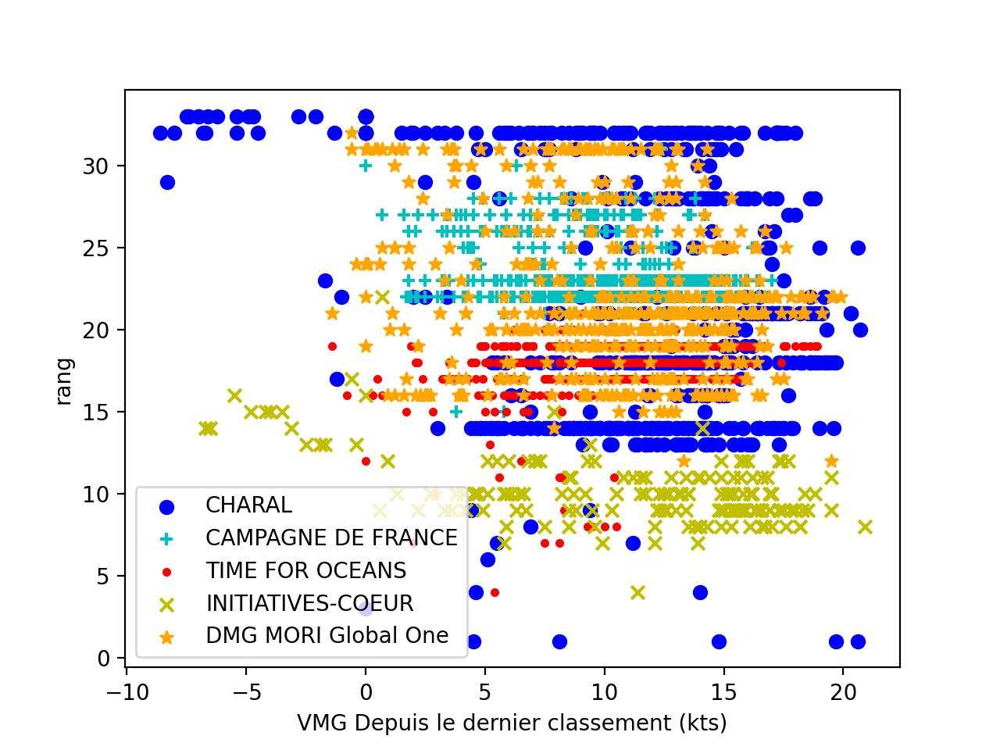

In [48]:
# observations dataset pour 5 bateaux pris au hasard (rang en fonction de la vitesse VMG )
#Nombre de bateaux à Afficher max (5)
n= 5
#Choix VMG 1 VMG/30 2
choix_vmg = 2
cv=['VMG Depuis 30 minutes (kts)', 'VMG Depuis le dernier classement (kts)',
                                   'VMG Depuis 24 heures (kts)'][choix_vmg-1]
# affiche la liste des bateaux 
lb = df_bateau['Bateau'].to_list()
lb = random.sample(lb,min(n,5))
colors=['b','c','r','y','orange']
tags = ['o','+','.','x','*']
print(lb)
def prep_df_plot(df,lb):
    df_b = df[['VMG Depuis 30 minutes (kts)', 'VMG Depuis le dernier classement (kts)',
                                   'VMG Depuis 24 heures (kts)', 'Rang', 'Bateau']]
    dfs={}
    for b in lb:
        dfs[b]=df_b.loc[df_b['Bateau'].apply(lambda x: x in b)].drop('Bateau',axis=1)
    return dfs
dfs= prep_df_plot(df_RVMG,lb)
fig,ax = plt.subplots(1,1)
ax.set_xlabel(cv)
ax.set_ylabel('rang')

for i,b in enumerate(lb) :
    ax.scatter(np.array(dfs[b][[cv]]),np.array(dfs[b][['Rang']]),color=colors[i], marker =tags[i], label=b)
    ax.legend()#ax[i].plot(np.array(dfs[b]), RNG, "b.")
    
    


<IPython.core.display.Javascript object>


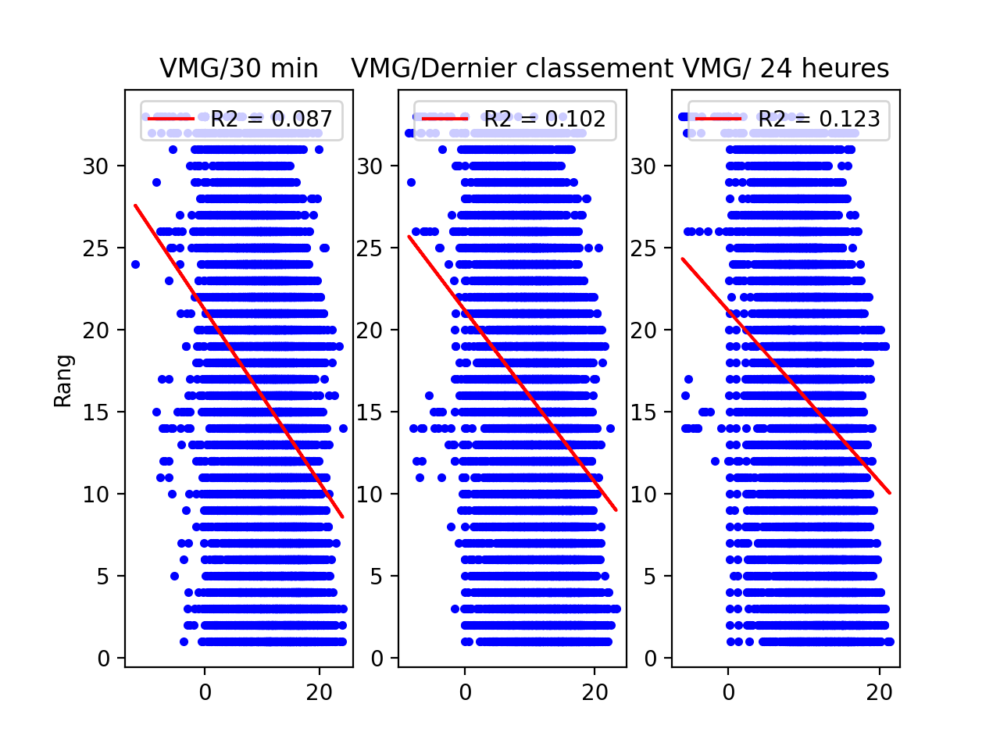

In [49]:
#Préparation du dataset pour les régressions : Features (VMGx),
#Target=Rang on travaille avec des array Numpy pour utiliser le module sklearn

def prep_df(df):
    return  np.array(pd.DataFrame(df[['VMG Depuis 30 minutes (kts)', 'VMG Depuis le dernier classement (kts)',
                                    'VMG Depuis 24 heures (kts)', 'Rang']]))
titres= ['VMG/30 min', 'VMG/Dernier classement','VMG/ 24 heures']
fig,ax = plt.subplots(1,3)
(plt.figure(fig)).figsize=(10,1)
RVMG = prep_df(df_RVMG)
RNG = RVMG[:,-1].reshape(-1, 1)
OLS= [LinearRegression(fit_intercept=True),LinearRegression(fit_intercept=True),LinearRegression(fit_intercept=True)]
VMG = [ RVMG[:,0].reshape(-1, 1),  RVMG[:,1].reshape(-1, 1),  RVMG[:,2].reshape(-1, 1)]
RNG = RVMG[:,-1].reshape(-1, 1)
OLSfit = [OLS[0].fit(VMG[0], RNG),OLS[1].fit(VMG[0], RNG),OLS[2].fit(VMG[0], RNG)]
y = [OLSfit[0].intercept_ + VMG[0]*OLSfit[0].coef_, OLSfit[1].intercept_ + VMG[1]*OLSfit[1].coef_ , OLSfit[2].intercept_ + VMG[2]*OLSfit[2].coef_]
    
for i in range(len(titres)):
    ax[i].set_title(titres[i])
    ax[i].plot(VMG[i], RNG, "b.")
    ax[i].plot(VMG[i], y[i], "r-", label =  'R2 = ' + str(OLSfit[i].score(VMG[i], RNG).round(3)))
    ax[i].legend()
ax[0].set_ylabel("Rang");
   

### Conclusion : 
La régression du rang en fonction des trois types de vitesses (VMGx) montrent un corrélation négative avec le classement : plus la vitesse est grande, plus le classement est faible, ce qui semble logique. 
En revanche, on ne peut pas compter sur un R2 fort étant donné la variance des résidus... Il est illusoire de prédire le vainqueur avec cette régression, ni son classement final. 

## Impact de la présence d'un foil sur le classement et la vitesse des voiliers

In [50]:
#Classement Franchissement arrivée et date d'arrivée, [] ='Abandon'
# on calcule les valeurs moyennes de VMG/24 et le Rang de classement d'arrivée 
import datetime
df_stats_foils=df_RVMG[['Bateau','Foils','VMG Depuis 24 heures (kts)','Rang']].groupby(['Foils','Bateau']).agg(['mean','std'])
df_rang_course = df_RVMG[['Bateau','Date']].groupby('Bateau').max()
df_stats_foils= df_stats_foils.reset_index()
df_rang_course = df_rang_course.reset_index()
df_rang_course['LRang'] = df_rang_course[['Bateau','Date']].apply(lambda x: df_RVMG.iloc[df_RVMG.loc[(df_RVMG['Bateau']==x[0]) & (df_RVMG['Date']== datetime.datetime(2021,1,27,14,0,0))].index]['Rang'].values.squeeze(),axis=1 ) 
df_rang_course['LRang'] = df_rang_course['LRang'].apply (lambda x: int(x) if x.size>0 else 'abandon' )
df_stats_foils['LRang']=df_stats_foils['Bateau'].apply(lambda x: df_rang_course.loc[(df_rang_course['Bateau']==x)]['LRang'].values)
df_stats_foils['LRang']= df_stats_foils['LRang'].apply(lambda x: float(x) if x!='abandon' else 0)
df_stats_foils=df_stats_foils.set_index(['Foils','Bateau'])
df_stats_foils

VMG Depuis 24 heures (kts)            \
                                                               mean       std   
Foils Bateau                                                                    
non   ARKEA PAPREC                                        11.296835  5.730591   
      BANQUE POPULAIRE X                                  11.652199  2.879996   
      CAMPAGNE DE FRANCE                                   9.932512  2.807062   
      Compagnie du Lit / Jiliti                           10.073957  2.961993   
      GROUPE APICIL                                       12.493827  3.205601   
      GROUPE SÉTIN                                         9.707395  3.265061   
      MEDALLIA                                            10.537805  3.269028   
      MERCI                                                7.811031  3.602900   
      OMIA - WATER FAMILY                                 12.376986  3.151705   
      ONE PLANET ONE OCEAN                                10.358904  2.934766   
      PURE - Best Western®                                11.196673  2.853527   
      STARK                                                8.673752  2.655274   
      TSE -  4MYPLANET                                     9.077015  2.336122   
      V and B-MAYENNE                                     12.246371  2.823471   
      Yes We Cam!                                         12.408402  3.277500   
oui   APIVIA                                              12.604990  3.607991   
      BUREAU VALLEE 2                                     12.580952  3.959721   
      CHARAL                                              11.228015  4.950901   
      CORUM L'EPARGNE                                      9.376000  3.410522   
      DMG MORI Global One                                 10.595972  3.557601   
      HUGO BOSS                                           10.966667  5.362875   
      INITIATIVES-COEUR                                   10.688344  5.721493   
      L'OCCITANE EN PROVENCE                              11.930118  3.990627   
      LA FABRIQUE                                         10.641608  3.217397   
      LA MIE CÂLINE - ARTISANS ARTIPÔLE                   10.724558  3.643996   
      LinkedOut                                           12.539256  3.862018   
      MACSF                                               12.247340  3.306687   
      Maître CoQ IV                                       12.527329  3.850941   
      NEWREST - ART & FENÊTRES                             8.594000  4.099769   
      PRB                                                 12.180292  4.901093   
      PRYSMIAN GROUP                                      12.516461  3.407611   
      SEAEXPLORER - YACHT CLUB DE MONACO                  12.542268  3.404726   
      TIME FOR OCEANS                                     10.596684  2.943662   

                                               Rang           LRang  
                                               mean       std        
Foils Bateau                                                         
non   ARKEA PAPREC                        10.398734  4.103657   0.0  
      BANQUE POPULAIRE X                  13.508604  2.288030  12.0  
      CAMPAGNE DE FRANCE                  23.522167  1.987606  22.0  
      Compagnie du Lit / Jiliti           24.295492  2.500401  23.0  
      GROUPE APICIL                        6.382716  3.019802   6.0  
      GROUPE SÉTIN                        21.302251  1.848173  21.0  
      MEDALLIA                            19.221254  2.901796  19.0  
      MERCI                               27.872902  1.997753   0.0  
      OMIA - WATER FAMILY                  7.572301  2.769433   9.0  
      ONE PLANET ONE OCEAN                19.964041  1.527476  20.0  
      PURE - Best Western®                13.415896  1.900011  13.0  
      STARK                               25.955777  1.352051  25.0  
      TSE -  4MYPLANET                    24.819403  1.821294  24.0  
    

<IPython.core.display.Javascript object>


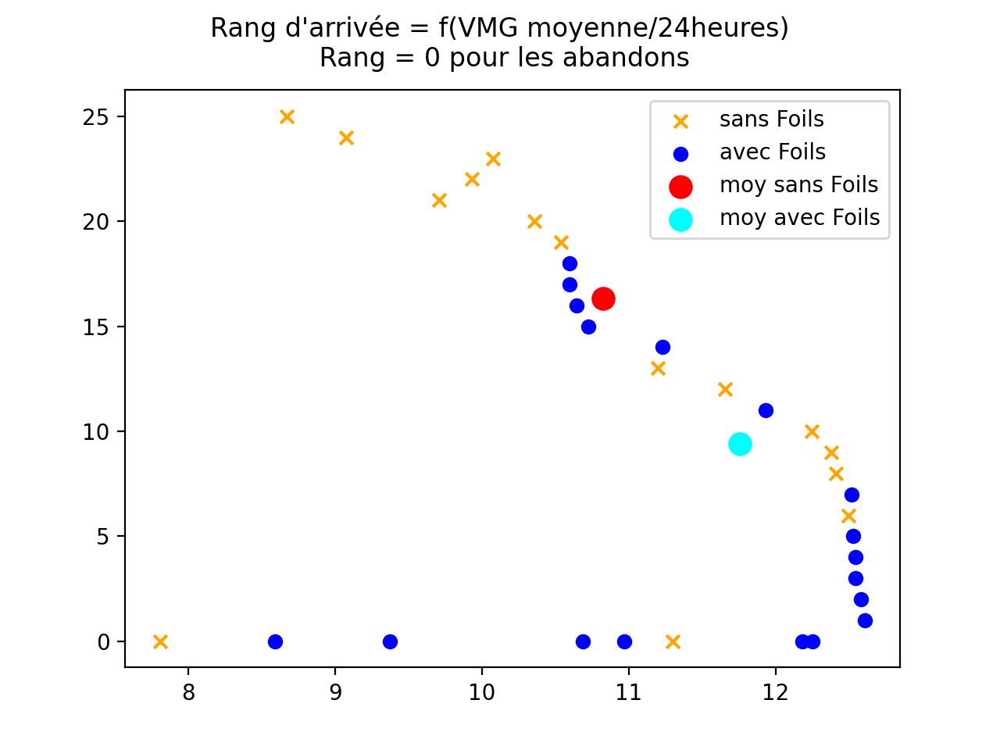

In [51]:
#Tracé du tableau calculé
fig1=plt.figure()
ax = plt.scatter(df_stats_foils.loc['non','VMG Depuis 24 heures (kts)']['mean'],df_stats_foils.loc['non','LRang'],marker ='x', color='orange',label='sans Foils')
plt.scatter(df_stats_foils.loc['oui','VMG Depuis 24 heures (kts)']['mean'],df_stats_foils.loc['oui','LRang'],marker ='o', color='b', label='avec Foils')
ax.figure.suptitle ('Rang d\'arrivée = f(VMG moyenne/24heures)\n Rang = 0 pour les abandons')
ax.figure.axes[0].set_xlabel = 'Vitesse moyenne/24h'
ax.figure.axes[0].set_ylabel = 'Rang'
vfoil = df_stats_foils[df_stats_foils['LRang']!=0].loc['oui']['VMG Depuis 24 heures (kts)']['mean'].mean()
rfoil = df_stats_foils[df_stats_foils['LRang']!=0].loc['oui']['LRang'].mean()
v_nofoil = df_stats_foils[df_stats_foils['LRang']!=0].loc['non']['VMG Depuis 24 heures (kts)']['mean'].mean()
r_nofoil = df_stats_foils[df_stats_foils['LRang']!=0].loc['non']['LRang'].mean()
plt.scatter(v_nofoil,r_nofoil, color='red', marker='o', linewidth=5, label='moy sans Foils')
plt.scatter(vfoil,rfoil, color='cyan', marker='o', linewidth=5,  label='moy avec Foils')

plt.legend();



### Conclusion :
Les navires avec foils trustent le podium avec 6 bateaux sur les 10 premiers. Leur vitesse moyenne sur l'épreuve est supérieur de 1nd environ. Les Foils sont donc avantageux pour la vitesse moyenne et donc pour le classement.

# Visualisation de la distance parcourue par voilier.
J'ai corrigé l'anomalie du Dataset donnant une distance parcourue de 2800 nautiques au départ de la course (premier timestamp du dataset pour l'ensemble des concurrents).


In [52]:
df_distance=df_RVMG[['Bateau','Skipper','Distance Depuis le dernier classement (nm)','Distance Depuis 24 heures (nm)']].groupby(['Bateau','Skipper']).agg(['sum','mean','max','min'])
df_stats_foils= df_stats_foils.reset_index()
df_distance= df_distance.reset_index()

In [53]:
#Les rangs des navigateurs ayant abandonner sont nuls après abandon. Ils apparaissent en tête de DF.

df_distance
df_distance['LRang']= df_distance['Bateau'].apply(lambda x: df_stats_foils.loc[(df_stats_foils['Bateau']==x)]['LRang'].values.squeeze())
df_distance.sort_values(['LRang'],inplace= True)
df_distance.head()

Bateau              Skipper  \
                                                    
1               ARKEA PAPREC      Sébastien Simon   
24                       PRB      Kevin Escoffier   
21  NEWREST - ART & FENÊTRES       Fabrice Amedeo   
6            CORUM L'EPARGNE     Nicolas Troussel   
19                     MERCI  Sébastien Destremau   

   Distance Depuis le dernier classement (nm)                         \
                                          sum       mean    max  min   
1                                      8689.3  54.995570  149.7  0.0   
24                                     7661.3  55.921898  142.7  0.0   
21                                     8404.5  42.022500  118.5  0.0   
6                                      2485.0  49.700000  143.9  0.0   
19                                    15755.2  37.782254  119.1  0.0   

   Distance Depuis 24 heures (nm)                         LRang  
                              sum        mean    max  min        
1                         49758.1  314.924684  508.8  4.5   0.0  
24                        44855.4  327.411679  482.7  5.1   0.0  
21                        47340.7  236.703500  403.2  0.0   0.0  
6                         13469.8  269.396000  433.3  4.5   0.0  
19                        88783.2  212.909353  388.7  5.3   0.0

Plusieurs observations :
- la distance totale parcourrue par les navigateurs n'est pas la même : cela tient aux choix de routes des navigateurs (optimisation vitesse - distance et prise en compte des risques de casse)


In [54]:
df_etude_dist=df_RVMG.loc[:,['Date','Skipper','Distance Depuis le dernier classement (nm)']]
df_etude_dist.sort_values(['Date'])
df_etude_dist['jour']= df_etude_dist['Date'].apply(lambda x: pd.Timestamp.date(x))

d=df_etude_dist.groupby(['jour','Skipper']).agg({'Distance Depuis le dernier classement (nm)':['sum']})

d=d.unstack('Skipper')
d

Distance Depuis le dernier classement (nm)               \
                                                  sum                
Skipper                                    Alan Roura Alex Thomson   
jour                                                                 
2020-11-08                                      108.2        119.4   
2020-11-09                                      237.7        255.9   
2020-11-10                                      219.9        269.2   
2020-11-11                                      260.2        299.9   
2020-11-12                                      293.1        322.6   
...                                               ...          ...   
2021-03-01                                        NaN          NaN   
2021-03-02                                        NaN          NaN   
2021-03-03                                        NaN          NaN   
2021-03-04                                        NaN          NaN   
2021-03-05                                        NaN          NaN   

                                                                      \
                                                                       
Skipper    Alexia Barrier Ari Huusela Armel Tripon Arnaud Boissieres   
jour                                                                   
2020-11-08           89.9        86.7        133.7               0.0   
2020-11-09          217.8       196.9        285.4             224.5   
2020-11-10          185.3       224.0        260.0             195.3   
2020-11-11          205.5       225.2        214.0             251.7   
2020-11-12          206.8       224.3        221.2             269.3   
...                   ...         ...          ...               ...   
2021-03-01            NaN       176.7          NaN               NaN   
2021-03-02            NaN       135.0          NaN               NaN   
2021-03-03            NaN       249.6          NaN               NaN   
2021-03-04            NaN       186.8          NaN               NaN   
2021-03-05            NaN        62.2          NaN               NaN   

                                                                          ...  \
                                                                          ...   
Skipper    Benjamin Dutreux Boris Herrmann Charlie Dalin Clarisse Cremer  ...   
jour                                                                      ...   
2020-11-08            107.4          122.7          94.4           108.8  ...   
2020-11-09            246.1          273.5         300.4           256.7  ...   
2020-11-10            223.1          264.9         270.8           232.1  ...   
2020-11-11            282.3          231.0         304.5           257.6  ...   
2020-11-12            317.0          301.8         344.7           301.4  ...   
...                     ...            ...           ...             ...  ...   
2021-03-01              NaN            NaN           NaN             NaN  ...   
2021-03-02              NaN            NaN           NaN             NaN  ...   
2021-03-03              NaN            NaN           NaN             NaN  ...   
2021-03-04              NaN            NaN           NaN             NaN  ...   
2021-03-05              NaN            NaN           NaN             NaN  ...   

                                                                      \
                                                                       
Skipper    Miranda Merron Nicolas Troussel Pip Hare Romain Attanasio   
jour                                                                   
2020-11-08           95.5            136.4     96.8            106.8   
2020-11-09          214.3            304.4    231.0            236.7   
2020-11-10          203.4            240.2    211.8            220.7   
2020-11-11          218.4            283.0    250.3            270.1   
2020-11-12          249.1            323.5    258.7            309.2   
...            

In [55]:
d=df_etude_dist.groupby(['jour','Skipper']).agg({'Distance Depuis le dernier classement (nm)':['sum']})
d=d.reset_index()
d=d.T.droplevel(1).T
fig = go.Figure(data=go.Heatmap(
        z=d['Distance Depuis le dernier classement (nm)'],
        y=d['Skipper'],
        x=d['jour'],
        colorscale='Viridis'))

fig.update_layout(
    title='Sommes des Distances Depuis le dernier classement (nm) par jour de course',
    xaxis_nticks=100)

fig.show()


Ce graphique montre les sommes des distances entre classement par jour et par Skipper. Je note plusieurs choses.
1. Les abandons sont bien visibles
2. en début de course, il y a deux vagues 'sombres' intercalées avec deux vagues 'jaunes'. Il s'agit des premières tempêtes essuyées par les navigateurs. La deuxième vague sera d'ailleurs fatale à 4 skippers qui abandonneront aux environs de début décembre.
3. on voit clairement l'arrêt technique de Béyou le 16 novembre(qui fera par la suite une très belle remontée) 

<IPython.core.display.Javascript object>


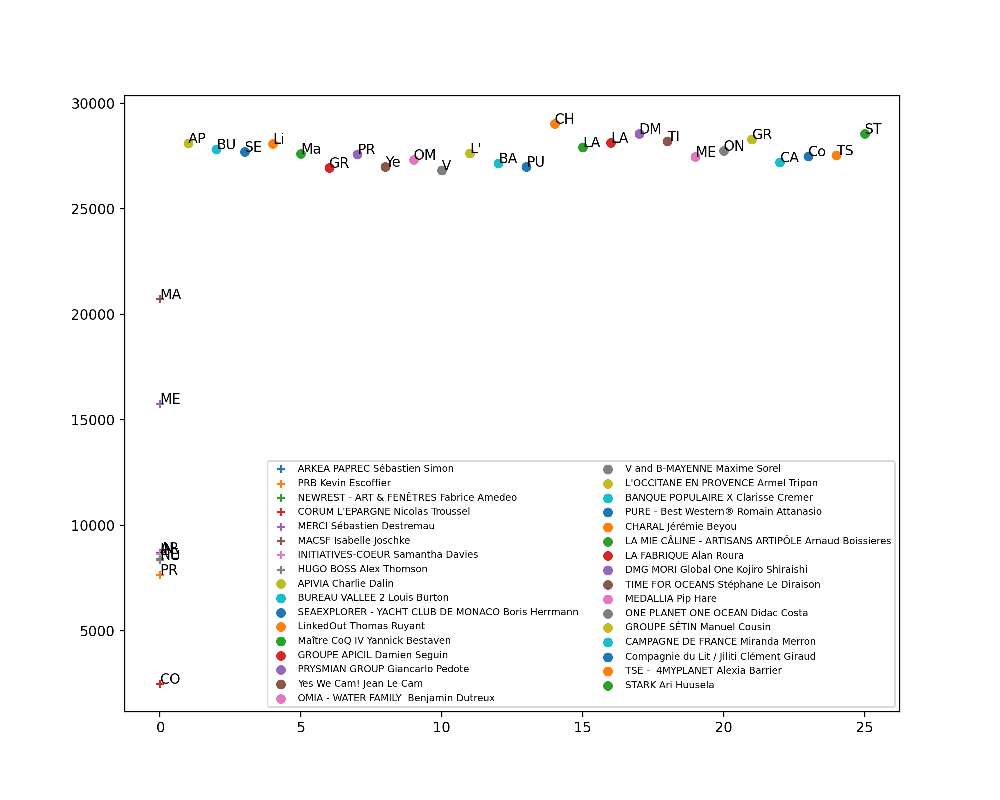

In [56]:
# Graphique Distance totale parcourrue / Skipper
fig2,ax=plt.subplots(figsize=(10,8))

for i in df_distance.index:
    x=df_distance.loc[[i],['Bateau','Distance Depuis le dernier classement (nm)','LRang','Skipper']].values[0][5]
    y=df_distance.loc[[i],['Bateau','Distance Depuis le dernier classement (nm)','LRang','Skipper']].values[0][1]
    lbl=df_distance.loc[[i],['Bateau','Distance Depuis le dernier classement (nm)','LRang','Skipper']].values[0][0]
    s=df_distance.loc[[i],['Bateau','Distance Depuis le dernier classement (nm)','LRang','Skipper']].values[0][6]
    mark='o'
    if x==0:
        mark='+'
    ax = plt.scatter(x,y, label=lbl +' ' +s, marker=mark)
    
    plt.annotate(lbl[0:2], (x, y), xycoords='data')

plt.legend(ncol=2, fontsize ='x-small');


In [70]:
# Je propose de faire le même graphique avec Plotly, en utilisant en plus le faceting pour séparer les finishers des autres et regarder si la présence de foils influe sur la distance parcourue
# On ajoute les Foils et un discret sur l'abandon ou pas 
df_distance=df_RVMG[['Bateau','Skipper','Distance Depuis le dernier classement (nm)','Distance Depuis 24 heures (nm)']].groupby(['Bateau','Skipper']).agg('sum')
df_distance= df_distance.reset_index()
df_distance['LRang']= df_distance['Bateau'].apply(lambda x: df_stats_foils.loc[(df_stats_foils['Bateau']==x)]['LRang'].values.squeeze())
df_distance['adandon'] = df_distance['LRang'].apply (lambda x: 'Oui' if x==0 else 'Non')
df_distance
df_l=df_bateau.loc[:,['Foils','Skipper']].copy()
df_test=pd.merge(df_distance,df_l, how="left", on='Skipper',sort=True)

fig = px.bar(df_test, x="Skipper", y="Distance Depuis le dernier classement (nm)", facet_col="Foils", facet_row="adandon")
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show()


# Cartes avec les routes d'un ou plusieurs voiliers.

In [71]:
df_trajectoire = pd.DataFrame(df_RVMG[['Date', 'Skipper','Bateau', 'Latitude', 'Longitude','Rang']])
df_trajectoire

,Date,Skipper,Bateau,Latitude,Longitude,Rang
0,2021-03-05 04:00:00,Ari Huusela,STARK,46.722500,-1.557778,25
1,2021-03-04 21:00:00,Ari Huusela,STARK,47.145556,-2.175000,25
2,2021-03-04 17:00:00,Ari Huusela,STARK,47.192500,-3.290000,25
3,2021-03-04 14:00:00,Ari Huusela,STARK,47.222778,-4.647500,25
4,2021-03-04 11:00:00,Ari Huusela,STARK,47.153056,-4.413611,25
...,...,...,...,...,...,...
15267,2020-11-08 14:00:00,Alexia Barrier,TSE - 4MYPLANET,46.439722,-0.174444,27
15268,2020-11-08 14:00:00,Isabelle Joschke,MACSF,46.427222,-0.193889,28
15269,2020-11-08 14:00:00,Sébastien Simon,ARKEA PAPREC,46.437500,-0.179722,29
15270,2020-11-08 14:00:00,Miranda Merron,CAMPAGNE DE FRANCE,46.427500,-0.190556,30


<IPython.core.display.Javascript object>


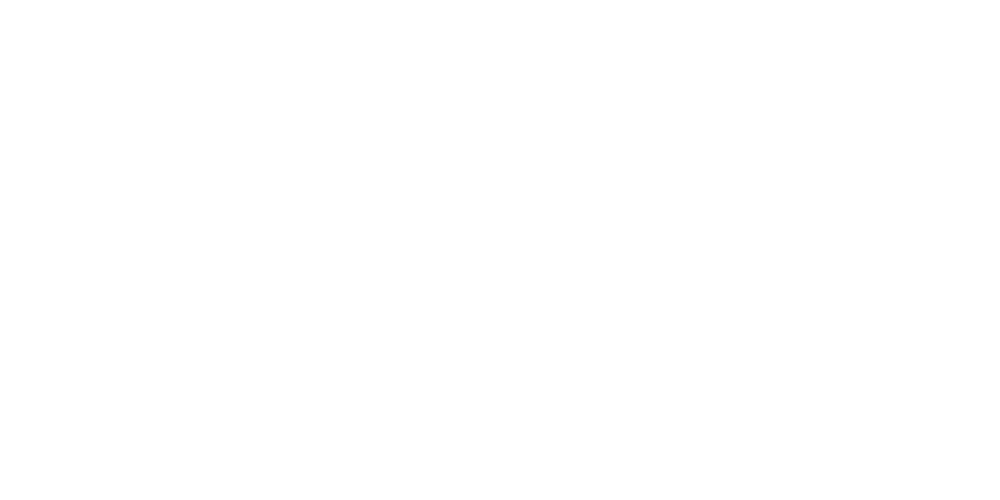

Shell is not a LinearRing
Shell is not a LinearRing


ValueError: Null geometry supports no operations

In [72]:

#Tracer des Trajectoires pour une liste de Bateaux/Skippers 
# Fournir une liste avec des Skippers ou des bateaux (Peu importe on retrouve les noms et on enlève les doublons )
Liste = ['Alexia', 'Ari' , 'Isabelle' , 'ARKE', 'APIVIA','Miranda']
colors =['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w']
Jour='25/12/2020'
Type = 'NearsidePerspective' # 1: NearsidePerspective 2 : platecarree 3 et autres: Mollweide
# autoloc : se centre sur la tête de course à la date du jour, sinon préciser les coordonnées central_lat et long 
#############################################################

def trace_cartopy(df_trajectoire,df_distance,Liste, colors, Jour=None, Type= 1 , cent_latitude=0,  cent_longitude=0, satellite_height=10000000.0, autoloc = False):
    plt.figure(tight_layout=True,figsize=(10, 5))
    Lat = cent_latitude
    Lon = cent_longitude
    l=df_distance[['Bateau']].values
    k=df_distance[['Skipper']].values 
    v={ l[key][0]:k[key][0]  for key,i in enumerate(l)}
    v.update({ k[key][0]:k[key][0]  for key,i in enumerate(l)})
    l_skip = [[ v[key] for key in v if t in key ] for t in Liste]
    l_skip=list(set([item for sublist in l_skip for item in sublist]))
    if Jour!= None :
        j = Jour.split('/')
        df_t = df_trajectoire.loc[(df_trajectoire['Date']<= dt.datetime(int(j[2]),int(j[1]),int(j[0])))]
        df_trajectoire=df_trajectoire.loc[(df_trajectoire['Date']<= dt.datetime(int(j[2]),int(j[1]),int(j[0])))]
        if autoloc == True:
            id=list(df_t.loc[(df_t['Date']>= 
            dt.datetime(int(j[2]),int(j[1]),int(j[0])-1)) & (df_t['Date']<= dt.datetime(int(j[2]),int(j[1]),int(j[0])) )]['Rang'].index)[0:5]
            Lat = df_t.loc[id,['Latitude']].mean()
            Lon = df_t.loc[id,['Longitude']].mean()
            
    
    
    if Type == 2 :
        ax = plt.axes(projection=ctp.crs.PlateCarree())
        ax.add_feature(ctp.feature.OCEAN)
        ax.add_feature(ctp.feature.COASTLINE)
        ax.stock_img()
    
    elif Type == 1: 
        ax = plt.axes(projection=ctp.crs.NearsidePerspective(
                        central_latitude = float(Lat),
                        central_longitude = float(Lon),
                        satellite_height=satellite_height))
        ax.add_feature(ctp.feature.OCEAN)
        ax.add_feature(ctp.feature.COASTLINE)
        ax.add_feature(ctp.feature.LAND)
        ax.coastlines(resolution='110m')
        ax.stock_img()
    else :
        ax= plt.axes(projection = ctp.crs.Mollweide())
        ax.add_feature(ctp.feature.OCEAN)
        ax.add_feature(ctp.feature.COASTLINE)
        ax.add_feature(ctp.feature.LAND)
        ax.coastlines(resolution='110m')
        ax.stock_img()

#Repérer le point de passage à la longitude 180 pour éviter une ligne d'Est en Ouest sur les cartes platecarrée
    index_passage_L180 ={}
    for dfx in df_trajectoire.groupby(['Skipper']):
        df1=dfx[1].sort_values(['Date'], ascending = True)[:-1]
        df2=dfx[1].sort_values(['Date'], ascending = True)[1:]
        df1=df1.reset_index().reset_index()
        df1=df1.rename({"index": "findex"},axis=1)
        df2=df2.reset_index().reset_index()
        df2=df2.rename({"index": "findex"},axis=1)
        dfm=df1.merge(df2,how='left',  right_on='level_0',left_on='level_0',suffixes=('','_y'))
        dfm['chg']= dfm.apply(lambda x: x['Longitude']*x['Longitude_y'] if x['Longitude']*x['Longitude_y']<-30000 else 'Nok',axis=1)
        if dfm.loc[dfm['chg']!='Nok'].size !=0:
             index_passage_L180[dfx[0]]=dfm.loc[dfm['chg']!='Nok'].values[0][1]
        else:
             index_passage_L180[dfx[0]]=0

# Tracé des trajectoires désirées dans Liste     
    c=0
    
    for skip in l_skip: 
  
            #retour            
            x=df_trajectoire['Longitude'].loc[(df_trajectoire['Skipper']==skip) & (df_trajectoire.index < int(index_passage_L180[skip]) )]
            y=df_trajectoire['Latitude'].loc[(df_trajectoire['Skipper']==skip) & (df_trajectoire.index < int(index_passage_L180[skip]) )]
            ax.plot(x,y, transform =ctp.crs.PlateCarree(),color=colors[c] )
           #aller                
            x=df_trajectoire['Longitude'].loc[(df_trajectoire['Skipper']==skip) & (df_trajectoire.index >= int(index_passage_L180[skip]) )]
            y=df_trajectoire['Latitude'].loc[(df_trajectoire['Skipper']==skip) & (df_trajectoire.index >= int(index_passage_L180[skip]) )]
            ax.plot(x,y,label = skip, transform =ctp.crs.PlateCarree(), color=colors[c])
            if c==len(colors)-1: 
                c=0
            c=c+1
    
    

    ax.set_xlabel('x label')  # Add an x-label to the axes.
    ax.set_ylabel('y label')  # Add a y-label to the axes.
    ax.set_title("Vendée Globle Challenge "+ Jour )
    plt.legend(fontsize='xx-small')
    plt.show()

trace_cartopy(df_trajectoire,df_distance,Liste, colors, Jour="12/12/2020", Type= 3 ,
              cent_latitude=-43,  cent_longitude=97, satellite_height=10000000.0, autoloc=False)



<IPython.core.display.Javascript object>


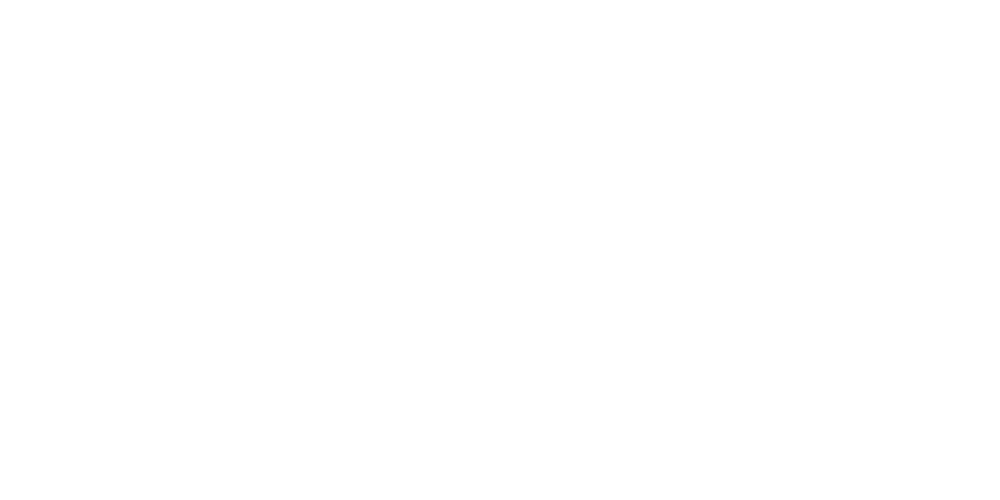

Shell is not a LinearRing
Shell is not a LinearRing


ValueError: Null geometry supports no operations

In [73]:
# On test l'autoloc sur la tête de course
trace_cartopy(df_trajectoire,df_distance,Liste, colors, Jour="15/01/2021", Type= 1,
              cent_latitude=0,  cent_longitude=0, satellite_height=10000000.0, autoloc=True)

In [74]:


fig = px.line_geo(df_trajectoire, lat="Latitude", lon="Longitude",
                  color="Bateau",
                  projection='orthographic',
                  hover_data={'Rang':True, 
                              'Date': True,
                            }
                 ) 
#    Projection['equirectangular', 'mercator', 'orthographic', 'natural earth',
#              'kavrayskiy7', 'miller', 'robinson', 'eckert4',
#            'azimuthal equal area', 'azimuthal equidistant', 'conic
#            equal area', 'conic conformal', 'conic equidistant',
#            'gnomonic', 'stereographic', 'mollweide', 'hammer',
#            'transverse mercator', 'albers usa', 'winkel tripel',
#            'aitoff', 'sinusoidal']
fig.update_layout(legend_font=dict(size=8), height=800, width=1000 )
fig.show()

In [75]:
# pour une date de début et une date de fin pour un autre type de projection
début='20/11/2020' 
fin = '25/11/2020'
dtdebut = dt.datetime(int(début.split('/')[2]),int(début.split('/')[1]),int(début.split('/')[0]))
dtfin = dt.datetime(int(fin.split('/')[2]),int(fin.split('/')[1]),int(fin.split('/')[0]))
 

##################################
df=df_trajectoire.loc[(df_trajectoire['Date']>=dtdebut) & (df_trajectoire['Date']<=dtfin)].copy()

fig = px.line_geo(df, lat="Latitude", lon="Longitude",
                  color="Bateau",
                  projection='mollweide',
                  hover_data={'Rang':True, 
                              'Date': True},
                  title = 'Vendée globe entre le ' +début + ' et le '+ fin
                           
                 ) 
#    Projection['equirectangular', 'mercator', 'orthographic', 'natural earth',
#              'kavrayskiy7', 'miller', 'robinson', 'eckert4',
#            'azimuthal equal area', 'azimuthal equidistant', 'conic
#            equal area', 'conic conformal', 'conic equidistant',
#            'gnomonic', 'stereographic', 'mollweide', 'hammer',
#            'transverse mercator', 'albers usa', 'winkel tripel',
#            'aitoff', 'sinusoidal']
fig.show()

## Conclusion :
Cartopy est difficile à coder par rapport à Plotly. Les animations sont complexes à coder et ne fonctionnent pas. Je décide donc de coder une animation avec les bibliothèques de Plotly, ce qui semble plus accessible. Je note la difficulté de se saisir des bibliothèques et de la philosophie associée. Par ailleurs, l'utilisation d'un Notebook n'est pas propice pour réaliser des interfaces permettant d'interagir avec les données dynamiquement. 

In [76]:
# Reduction du DF a un classement par jour pour faire une animation 
df_animation_py =  df_trajectoire.copy()
df_animation_py['jour']= df_animation_py['Date'].apply(lambda x: pd.Timestamp.date(x))
group=df_animation_py.groupby(['Skipper','Bateau','jour'])
idx=[]
for g in group:
    idx.append(g[1]['Date'].idxmax())
df_a=df_animation_py.iloc[idx]

df_a

,Date,Skipper,Bateau,Latitude,Longitude,Rang,jour
15170,2020-11-08 21:00:00,Alan Roura,LA FABRIQUE,46.470000,-3.573611,27,2020-11-08
14971,2020-11-09 21:00:00,Alan Roura,LA FABRIQUE,45.452222,-8.800833,26,2020-11-09
14772,2020-11-10 21:00:00,Alan Roura,LA FABRIQUE,43.719167,-11.094167,25,2020-11-10
14568,2020-11-11 21:00:00,Alan Roura,LA FABRIQUE,41.381389,-16.693611,19,2020-11-11
14369,2020-11-12 21:00:00,Alan Roura,LA FABRIQUE,38.136111,-20.140000,18,2020-11-12
...,...,...,...,...,...,...,...
2123,2021-01-23 21:00:00,Yannick Bestaven,Maître CoQ IV,34.089444,-28.592222,5,2021-01-23
1973,2021-01-24 21:00:00,Yannick Bestaven,Maître CoQ IV,40.224444,-26.572222,5,2021-01-24
1823,2021-01-25 21:00:00,Yannick Bestaven,Maître CoQ IV,44.086944,-21.133056,5,2021-01-25
1673,2021-01-26 21:00:00,Yannick Bestaven,Maître CoQ IV,47.595833,-14.158333,5,2021-01-26


In [77]:

jours = [each for each in list(df_a.jour.unique())]  #Tous les jours du DF
Bateaux = [str(each) for each in list(df_a.Bateau.unique())]
Skippers =  [str(each) for each in list(df_a.Skipper.unique())]
# pour chaque dessin, il faut des paramètres Graphiques et le semblant d'interface pour l'animation, les frames et les data 
figure = {
    'data': [],
    'layout': {},
    'frames': []
}


figure['layout']['geo'] = dict(projection_type="orthographic",showframe=False, showland=True, showcoastlines=True, showcountries=True,
               countrywidth=1, 
              landcolor = 'rgb(220, 220, 220)',
              subunitwidth=1,
              showlakes = False,
              lakecolor = 'rgb(255, 255, 255)',
              countrycolor="rgb(10,10, 10)")
figure['layout']['hovermode'] = 'closest'
figure['layout']['sliders'] = {
    'args': [
        'transition', {
            'duration': 400,
            'easing': 'cubic-in-out'
        }
    ],
    'initialValue': '2020-11-08',
    'plotlycommand': 'animate',
    'values': jours,
    'visible': True
}

figure['layout']['updatemenus'] = [
    {
        'buttons': [
            {
                'args': [None, {'frame': {'duration': 500, 'redraw': True},
                         'fromcurrent': True, 'transition': {'duration': 300, 'easing': 'quadratic-in-out'}}],
                'label': 'Play',
                'method': 'animate'
            },
            {
                'args': [[None], {'frame': {'duration': 0, 'redraw': True}, 'mode': 'immediate',
                'transition': {'duration': 0}}],
                'label': 'Pause',
                'method': 'animate'
            }
        ],
        'direction': 'left',
        'pad': {'r': 10, 't': 87},
        'showactive': False,
        'type': 'buttons',
        'x': 0.1,
        'xanchor': 'right',
        'y': 0,
        'yanchor': 'top'
    }
]

sliders_dict = {
    'active': 0,
    'yanchor': 'top',
    'xanchor': 'left',
    'currentvalue': {
        'font': {'size': 20},
        'prefix': 'Jour:',
        'visible': True,
        'xanchor': 'right'
    },
    'transition': {'duration': 300, 'easing': 'cubic-in-out'},
    'pad': {'b': 10, 't': 50},
    'len': 0.9,
    'x': 0.1,
    'y': 0,
    'steps': []
}

jour = dt.datetime(2020,11,8)
for ba in Bateaux:
    dataset_by_jour = df_a[df_a['jour'] == jour]
    dataset_by_jour_and_bateau = dataset_by_jour[dataset_by_jour['Bateau'] == ba]
    
    data_dict = dict(
    type='scattergeo',
    lon = dataset_by_jour_and_bateau['Longitude'],
    lat = dataset_by_jour_and_bateau['Latitude'],
    hoverinfo = 'text',
    text = ba,
    mode = 'markers',
    marker=dict(
        sizemode = 'area',
        sizeref = 1,
        size= 10 ,
        line = dict(width=1,color = "white"),
        #color = custom_colors[ty],
        opacity = 0.7),
)
    figure['data'].append(data_dict)
    
# Stockage des données par jour
for jour in jours:
    frame = {'data': [], 'name': str(jour)}
    for ba in Bateaux:
        dataset_by_jour = df_a[df_a['jour'] == jour]
        dataset_by_jour_and_bateau = dataset_by_jour[dataset_by_jour['Bateau'] == ba]
        data_dict = dict(
                type='scattergeo',
                lon = dataset_by_jour_and_bateau['Longitude'],
                lat = dataset_by_jour_and_bateau['Latitude'],
                hoverinfo = 'text',
                text = ba + ' rang = ' + str(dataset_by_jour_and_bateau['Rang'].values) ,
                mode = 'markers',
                marker=dict(
                    sizemode = 'area',
                    sizeref = 1,
                    size= 10 ,
                    line = dict(width=1,color = "white"),
                    
                    opacity = 0.7),
                name = ba
            )
        frame['data'].append(data_dict)

    figure['frames'].append(frame)
    slider_step = {'args': [
        [jour],
        {'frame': {'duration': 300, 'redraw': True},
         'mode': 'immediate',
       'transition': {'duration': 300}}
     ],
     'label': str(jour),
     'method': 'animate'}
    sliders_dict['steps'].append(slider_step)


figure["layout"]["autosize"]= True
figure["layout"]["title"] = "Vendée Globe : The Race"       

figure['layout']['sliders'] = [sliders_dict]
figure['layout']['legend_font']= dict(size=8)
figure['layout']['height'] = 1000
figure['layout']['width'] = 1000
iplot(figure)



# Analyses de séries temporelles


Je propose de visualiser les rang en fonction du temps. 

In [78]:
# Affiche les rangs en fonction du temps pour : un nombre de skipper tirés au hasard ou une liste précise de Skippers
def serie_classement(df, nombre_skipper_aff,liste_précise=None):
    Skippers = df["Skipper"].unique()
    plt.subplots(figsize=(10, 7))
    plt.title("Rang en fonction du temps")
    if liste_précise == None:
        random.shuffle(Skippers)
    
    else: 
        Sk = [s for s in liste_précise if s in Skippers]
        print(Sk, Skippers, liste_précise)
        Skippers = Sk
       
    
    for skip in Skippers[:min(len(Skippers),nombre_skipper_aff)]:
        rang = df['Rang'].loc[(df["Skipper"] == skip)]
        dates = df['Date'].loc[(df["Skipper"] == skip)]
        plt.plot(dates, rang, label = skip)
    
    plt.xlabel("Date")
    plt.ylabel("Rang")
    plt.legend(fontsize='xx-small')
    return 

#['Louis Burton' 'Boris Herrmann' 'Jérémie Beyou' 'Thomas Ruyant'
# 'Maxime Sorel' 'Fabrice Amedeo' 'Jean Le Cam' 'Alex Thomson'
# 'Sébastien Destremau' 'Pip Hare' 'Kevin Escoffier' 'Stéphane Le Diraison'
# 'Romain Attanasio' 'Damien Seguin' 'Clément Giraud' 'Samantha Davies'
# 'Yannick Bestaven' 'Giancarlo Pedote' 'Kojiro Shiraishi'
# 'Nicolas Troussel' 'Manuel Cousin' 'Clarisse Cremer' 'Alan Roura'
# 'Didac Costa' 'Benjamin Dutreux' 'Armel Tripon' 'Alexia Barrier'
# 'Isabelle Joschke' 'Sébastien Simon' 'Miranda Merron' 'Ari Huusela'
# 'Charlie Dalin' 'Arnaud Boissieres']

<IPython.core.display.Javascript object>


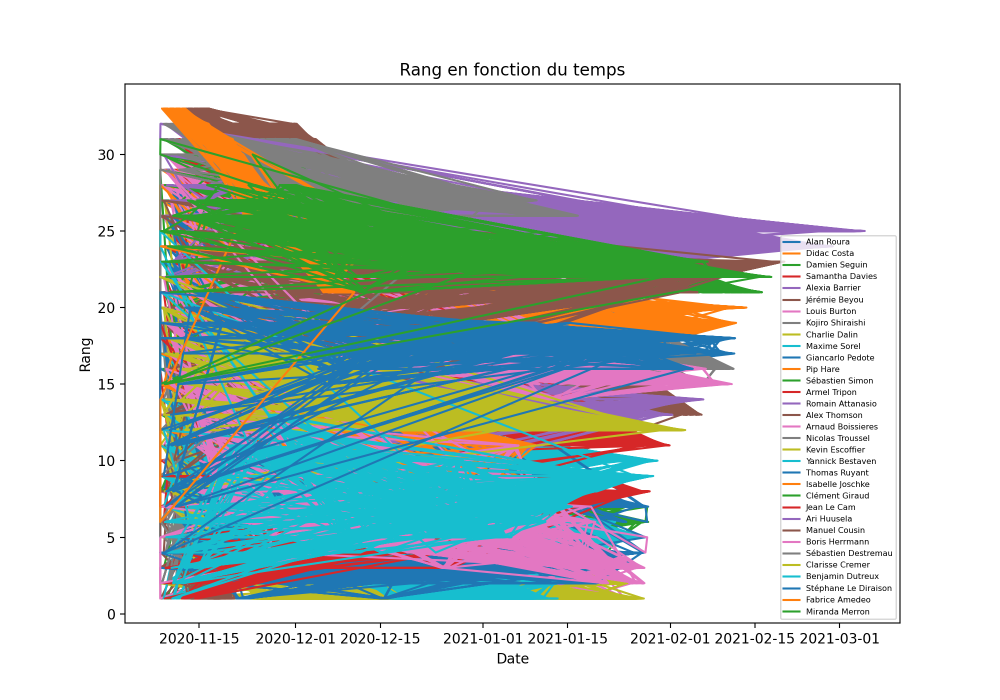

In [79]:
# pour une liste précise
liste = ['Romain Attanasio', 'Damien Seguin', 'Clément Giraud', 'Samantha Davies']
# 'Yannick Bestaven' 'Giancarlo Pedote'
serie_classement(df_classement,33)
#Avec Plotly express, on dispose en plus d'une capacité d'interaction. 

fig = px.line(df_RVMG, x="Date", y="Rang", color='Skipper',facet_col="Foils", title='Vendée Globe 2020 Rang= f(t)')
fig.show()



Conclusion : 
Que ce soit avec matplotlib ou plotly, il est facile de représenter des séries temporelles. 
On observe que les abandons se viualisent facilement (interruption de la série avant la fin de la course.
Chaque croisement de courbe indique des phases de "disputes" pour le classement : les bateaux sont en principe proches.
Cela me donne l'idée de chercher pour chaque skipper, la liste des skippers avec qui la course a été la plus disputée... 